# 📒 Séance 4 - Analyse spatiale de données urbanistiques  🌐 🏬

**Mettre en place des chaînes de traitements documentées automatisées et reproductibles**


* Jointure spatiales et agrégations spatiales
* Opérateur de recouvrement (intersect, difference, union,...)
* Analyses de recouvrement
* Analyse du plus proche voisin
* Création d'index spatial
* Analyse spatiale à différentes échelles
* Travailler avec un volume important de données (plusieurs millions d'entités spatiales sur un département)
* Mettre en place une chaîne de traitements automatisée et reproductible

## 🧰 Configuration environnement de travail

In [ ]:
#Initialisation de l'environnement avec geopandas
!apt update
!apt install gdal-bin python-gdal python3-gdal
# Install rtree - Geopandas requirment
!apt install python3-rtree
# Install Geopandas
!pip install geopandas
# Install Fiona
!pip install Fiona
# Instal contextily (fonds de carte)
!pip install contextily
# Install mapclassify (cartographie thématique)
!pip install mapclassify
# Depuis sa version 0.8, Geopandas peut fonctionner de manière expérimental avec Pygeos ce qui accèlère certaines opérations
!pip install pygeos
# Pour la cartographie interactive
!pip install folium
# Install scalebar
!pip install matplotlib_scalebar

In [2]:
#Importation des librairies nécessaires
import pandas as pd #Gestion de données
import matplotlib.pyplot as plt #Visualisation de données
import geopandas as gpd #Gestion données spatiales
import contextily as ctx #Fonds de carte
import fiona as np #lecture et écriture de données spatiales
import numpy as np #Manipulation de tableaux
import shapely #Manipulation de géométrie
import folium #Cartographie interactive
import mapclassify #Cartographie thématique
from matplotlib_scalebar.scalebar import ScaleBar #Echhelle cartographique


# 🔳 Analyse spatiale avec des opérateurs métriques et de recouvrement

## Récupération et préparation des données

In [ ]:
#Téléchargement des datas depuis le site opendata de IDF Mobilité
!wget -O ArretsTC.geojson https://data.iledefrance-mobilites.fr/api/explore/v2.1/catalog/datasets/emplacement-des-gares-idf-data-generalisee/exports/geojson?lang=fr&timezone=Europe%2FBerlin

#Téléchargement des datas depuis le site opendata de Paris
!wget -O IRIS.geojson https://data.iledefrance.fr/api/explore/v2.1/catalog/datasets/iris/exports/geojson?lang=fr&timezone=Europe%2FBerlin

,dep,insee_com,nom_com,iris,code_iris,nom_iris,typ_iris,geo_point_2d,id,geometry
7,75,75108,Paris 8e Arrondissement,2902,751082902,Champs Élysées 2,A,"{ ""lon"": 2.3070845643781905, ""lat"": 48.8657944...",IRIS____0000000751082902,"POLYGON ((648768.5 6862911.4, 648766.8 6862944..."
8,75,75109,Paris 9e Arrondissement,3403,751093403,Chaussée d'Antin 3,A,"{ ""lon"": 2.3283602776011918, ""lat"": 48.8717586...",IRIS____0000000751093403,"POLYGON ((650851.1 6863568.3, 650706 6863531.3..."
9,75,75110,Paris 10e Arrondissement,3710,751103710,Saint-Vincent de Paul 10,A,"{ ""lon"": 2.3600699484401635, ""lat"": 48.8781772...",IRIS____0000000751103710,"POLYGON ((653231.8 6864509.9, 653201.1 6864449..."


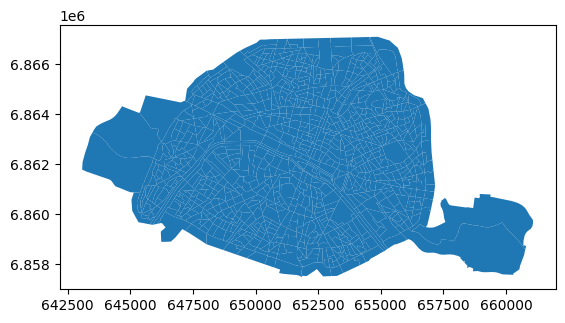

In [4]:
#Importer et reprojeter la couche des IRIS de Paris

IRIS= gpd.read_file("IRIS.geojson", encoding='utf-8')
IRIS = IRIS[(IRIS["dep"] == "75")]
IRIS = IRIS.to_crs(2154)
IRIS.plot()
IRIS.head(3)

,geo_point_2d,codeunique,nom_long,nom_so_gar,nom_su_gar,id_ref_zdc,nom_zdc,id_ref_zda,nom_zda,idrefliga,...,terrer,termetro,tertram,terval,exploitant,idf,principal,x,y,geometry
0,"{ ""lon"": 2.690252782201096, ""lat"": 48.77077891...",11,Ozoir-la-Ferrière,None,None,462934,Ozoir-la-Ferrière,462901,Ozoir-la-Ferrière,A01843,...,0,0,0,0,SNCF,1,0,677235.3132,6.852342e+06,POINT (677235.313 6852342.427)
1,"{ ""lon"": 2.8102482193626619, ""lat"": 48.9030729...",14,Esbly,None,None,68653,Esbly,47322,Esbly,A02945 / A01844,...,0,0,1,0,SNCF / STRETTO,1,0,686089.6333,6.867025e+06,POINT (686089.633 6867024.668)
2,"{ ""lon"": 3.0317584458373279, ""lat"": 49.0217572...",18,Lizy-sur-Ourcq,None,None,69237,Lizy-sur-Ourcq,47486,Lizy-sur-Ourcq,A01844,...,0,0,0,0,SNCF,1,0,702322.8492,6.880207e+06,POINT (702322.849 6880206.813)


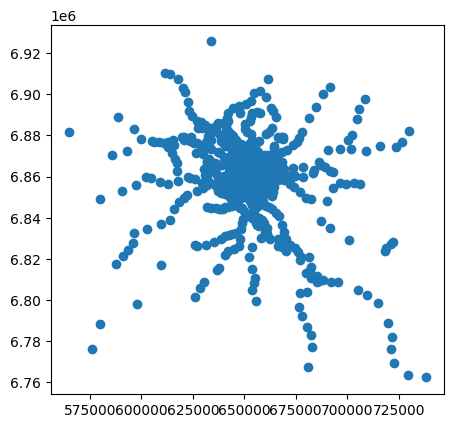

In [5]:
#Importer la couche des arrêts de TC

ArretsTC= gpd.read_file("ArretsTC.geojson", encoding='utf-8')
ArretsTC = ArretsTC.to_crs(2154)
ArretsTC.plot()
ArretsTC.head(3)

,geo_point_2d_1,codeunique,nom_long,nom_so_gar,nom_su_gar,id_ref_zdc,nom_zdc,id_ref_zda,nom_zda,idrefliga,...,dep,insee_com,nom_com,iris,code_iris,nom_iris,typ_iris,geo_point_2d_2,id,geometry
0,"{ ""lon"": 2.326999858880872, ""lat"": 48.87380673...",103061,Havre-Caumartin,None,None,73688,Gare Saint-Lazare,58718,Haussmann Saint-Lazare,A01536 / A01542,...,75,75108,Paris 8e Arrondissement,3108,751083108,Madeleine 8,A,"{ ""lon"": 2.324425848416626, ""lat"": 48.87470830...",IRIS____0000000751083108,POINT (650636.366 6863963.972)
1,"{ ""lon"": 2.3609564886610004, ""lat"": 48.8552362...",101049,Saint-Paul,Le Marais,None,71222,Saint-Paul (Le Marais),44881,Saint-Paul (Le Marais),A01534,...,75,75104,Paris 4e Arrondissement,1401,751041401,Saint-Gervais 1,H,"{ ""lon"": 2.357764008585066, ""lat"": 48.85473806...",IRIS____0000000751041401,POINT (653110.27 6861878.387)
2,"{ ""lon"": 2.3229434122435415, ""lat"": 48.8662858...",101061,Concorde,None,None,71298,Concorde,45676,Concorde,A01534 / A01541 / A01545,...,75,75108,Paris 8e Arrondissement,2907,751082907,Concorde Jardin Champs Élysées,D,"{ ""lon"": 2.315526975748881, ""lat"": 48.86648918...",IRIS____0000000751082907,POINT (650331.668 6863130.246)
3,"{ ""lon"": 2.3745819699964126, ""lat"": 48.8652537...",103043,Parmentier,None,None,71801,Parmentier,58725,Parmentier,A01536,...,75,75111,Paris 11e Arrondissement,4103,751114103,Folie Méricourt 3,H,"{ ""lon"": 2.3753878489397611, ""lat"": 48.8661659...",IRIS____0000000751114103,POINT (654118.84 6862984.251)
4,"{ ""lon"": 2.3465523363532119, ""lat"": 48.8675130...",103053,Sentier,None,None,73634,Sentier,44825,Sentier,A01536,...,75,75102,Paris 2e Arrondissement,0702,751020702,Mail 2,H,"{ ""lon"": 2.3436406493200241, ""lat"": 48.8670219...",IRIS____0000000751020702,POINT (652064.688 6863252.112)


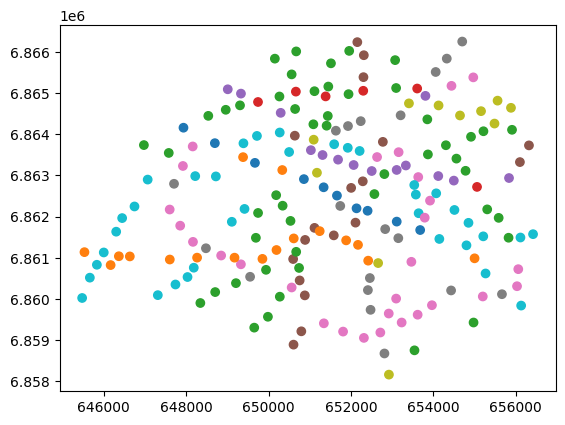

In [6]:
# Ne garder que les arrêts de métro de Paris (méthode Intersection)

Metros = ArretsTC[(ArretsTC["mode"] == 'METRO')]
MetrosIntersect = gpd.overlay(Metros, IRIS, how='intersection')
MetrosIntersect.plot(column='res_com')
MetrosIntersect.head()

,geo_point_2d,codeunique,nom_long,nom_so_gar,nom_su_gar,id_ref_zdc,nom_zdc,id_ref_zda,nom_zda,idrefliga,...,terrer,termetro,tertram,terval,exploitant,idf,principal,x,y,geometry
739,"{ ""lon"": 2.3587857062577715, ""lat"": 48.8218159...",107081,Maison Blanche,None,None,70645,Maison Blanche,44057,Maison Blanche,A01540 / A01547,...,0,0,0,0,RATP,1,0,652903.9414,6.858205e+06,POINT (652920.817 6858163.693)
531,"{ ""lon"": 2.3572456507586859, ""lat"": 48.8264260...",107079,Tolbiac,None,None,71001,Tolbiac,43411,Tolbiac,A01540,...,0,0,0,0,RATP,1,0,652811.9180,6.858677e+06,POINT (652811.918 6858677.193)
335,"{ ""lon"": 2.3504148706484043, ""lat"": 48.8297905...",106051,Corvisart,None,None,71013,Corvisart,45274,Corvisart,A01539,...,0,0,0,0,RATP,1,0,652313.5222,6.859055e+06,POINT (652313.522 6859055.391)
935,"{ ""lon"": 2.3671730244778462, ""lat"": 48.8271636...",114005,Olympiades,None,None,71557,Olympiades,479056,Olympiades,A01547,...,0,0,0,0,RATP,1,1,653541.3819,6.858753e+06,POINT (653541.382 6858753.32)
712,"{ ""lon"": 2.3866324020669851, ""lat"": 48.8333385...",114001,Cour Saint-Émilion,None,None,71576,Cour Saint-Emilion,45234,Cour Saint-Emilion,A01547,...,0,0,0,0,RATP,1,0,654975.2848,6.859429e+06,POINT (654975.285 6859428.633)


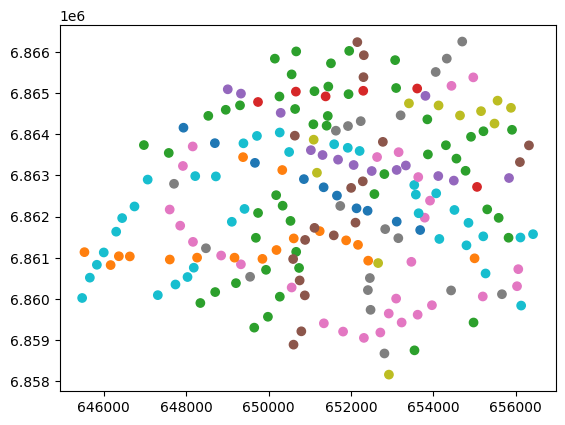

In [7]:
# Ne garder que les arrêts de métro de Paris (méthode Clip)

MetrosClip = Metros.clip(IRIS, keep_geom_type=False)
MetrosClip.plot(column='res_com')
MetrosClip.head()

<Axes: >

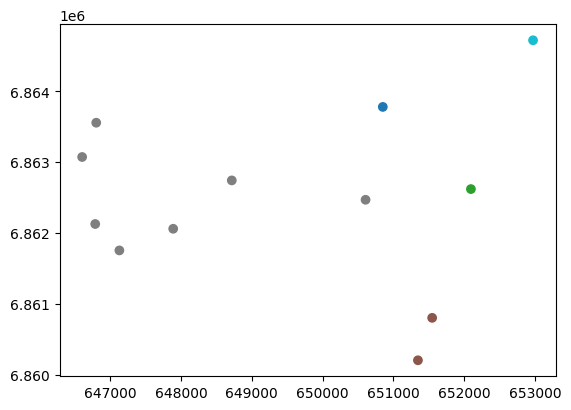

In [8]:
# Ne garder que les arrêts de RER de Paris

RER = ArretsTC[(ArretsTC["mode"] == 'RER')]
RER = gpd.overlay(RER, IRIS, how='intersection')
RER.plot(column='res_com')

## Fonctions de regroupement

https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.dissolve.html

<Axes: >

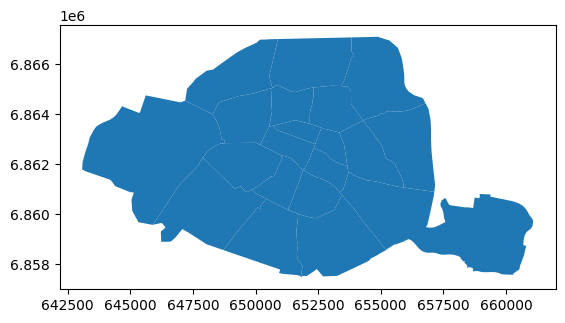

In [9]:
ARDT = IRIS.dissolve(by='insee_com')
ARDT.plot()

## Analyses de recouvrement

Documentation : https://geopandas.org/en/stable/docs/reference/api/geopandas.overlay.html

<Axes: >

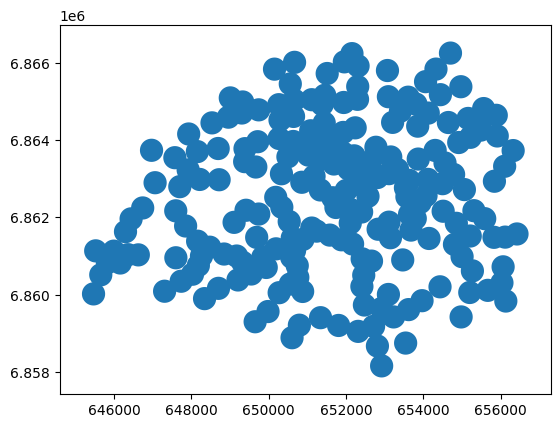

In [10]:
# Buffer de 300m autour des métros

Metrosbuffer = MetrosClip.copy()
Metrosbuffer['geometry'] = Metrosbuffer.geometry.buffer(300)
Metrosbuffer.plot()

<ipython-input-11-455749985a96>:2: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  grouped_polygon = Metrosbuffer.unary_union


,geometry
0,"MULTIPOLYGON (((648575.124 6859711.826, 648555..."


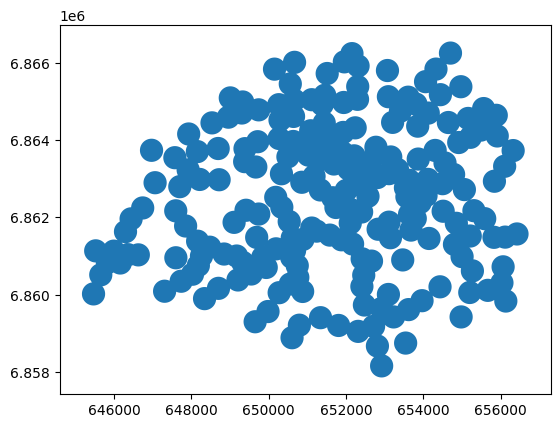

In [11]:
#Grouper les buffers dans une seule entité spatiale
grouped_polygon = Metrosbuffer.unary_union
Buffergrouped = gpd.GeoDataFrame(geometry=[grouped_polygon], crs=Metrosbuffer.crs)
Buffergrouped.plot()
Buffergrouped.head()

<Axes: >

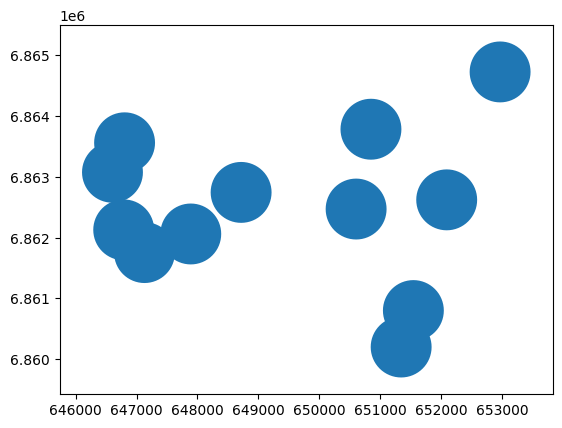

In [12]:
# Buffer de 500m autour des RER

RERbuffer = RER.copy()
RERbuffer['geometry'] = RERbuffer.geometry.buffer(500)
RERbuffer.plot()

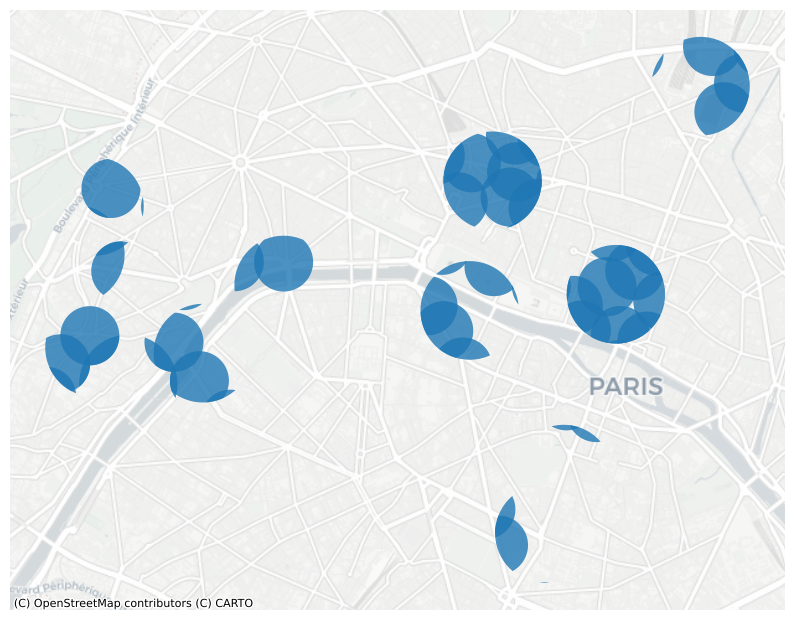

In [13]:
# INTERSECTION des zones à moins de 500m d'une station de RER et à moins de 300m d'une station de métro

Intersect = gpd.overlay(RERbuffer, Metrosbuffer, how='intersection')
MapIntersect, ax = plt.subplots(figsize=(10,10))
Intersect.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8,)
ctx.add_basemap(ax,  source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.show()

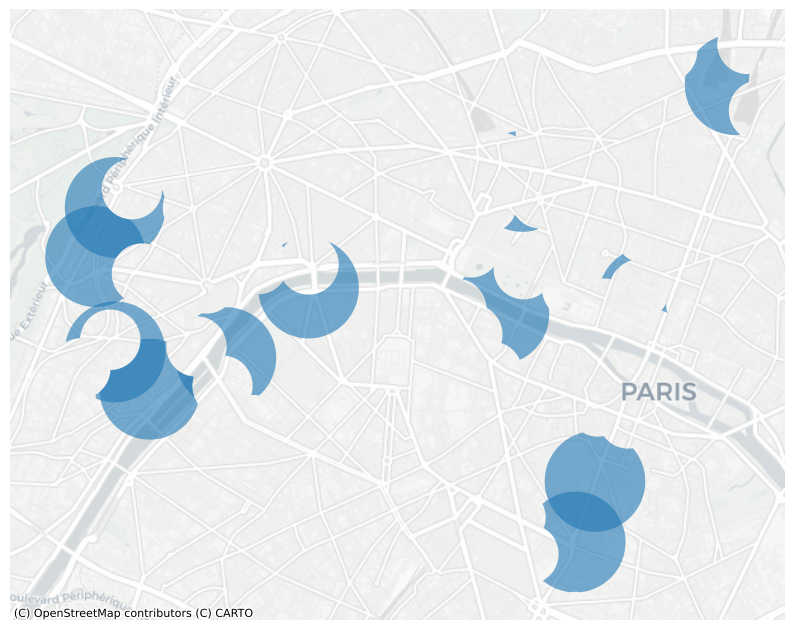

In [14]:
# DIFFERENCE des zones situées à moins de 500m d'un métro mais à plus de 300m d'un métro

Difference = gpd.overlay(RERbuffer, Metrosbuffer, how='difference')

MapDifference, ax = plt.subplots(figsize=(10,10))
Difference.to_crs('EPSG:3857').plot(ax=ax, alpha=0.6,)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.show()

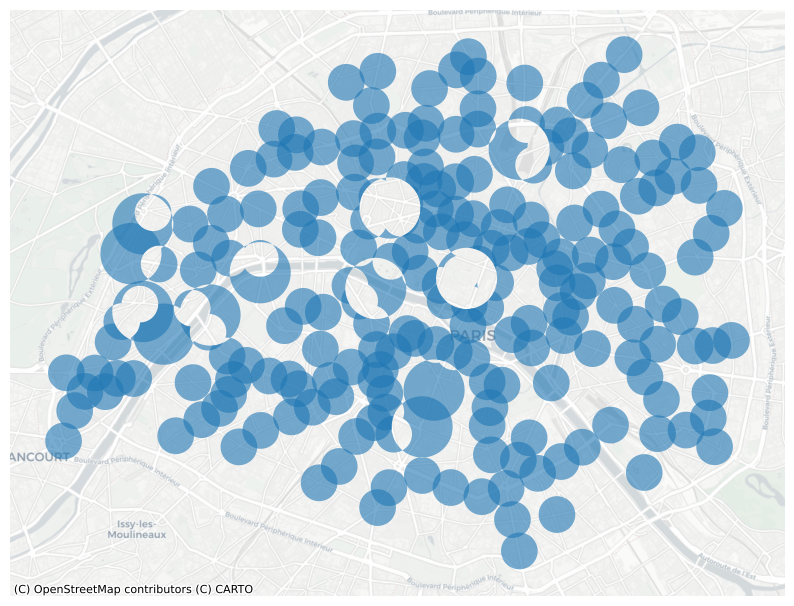

In [15]:
# Différenciation symétrique

DifferenceSymetrique = gpd.overlay(Metrosbuffer, RERbuffer, how='symmetric_difference')

carte, ax = plt.subplots(figsize=(10,10))
DifferenceSymetrique.to_crs('EPSG:3857').plot(ax=ax, alpha=0.6,)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.show()

<ipython-input-16-014acfd3c7a4>:4: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  grouped_Union = Union.unary_union


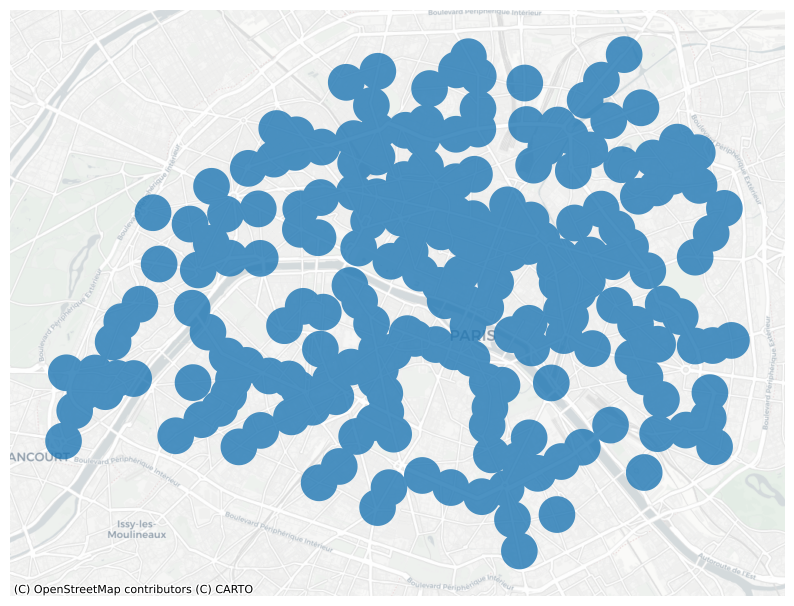

In [16]:
# UNION des zones tampons des métros et des RER

Union = gpd.overlay(Metrosbuffer, RERbuffer, how='union')
grouped_Union = Union.unary_union
Buffergrouped = gpd.GeoDataFrame(geometry=[grouped_polygon], crs=Metrosbuffer.crs)

MapUnion, ax = plt.subplots(figsize=(10,10))
Buffergrouped.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8,)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.show()

# 🎆 Analyse du plus proche voisin

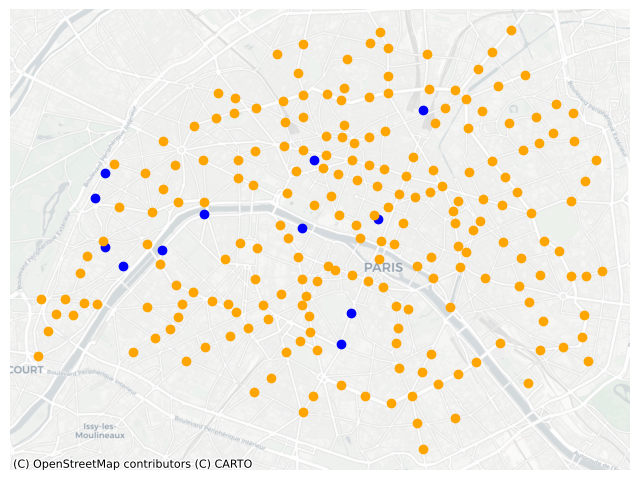

In [25]:
# Affichage des stations de RER et de métro

Metros=MetrosClip

TC, ax = plt.subplots(figsize=(8,8))
RER.to_crs('EPSG:3857').plot(ax=ax, color="blue")
Metros.to_crs('EPSG:3857').plot(ax=ax, color= "orange")
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.show()

In [18]:
#Calcul des distances entre les arrêts de RER et les stations de métros

from shapely.geometry import Point, MultiPoint
from shapely.ops import nearest_points

def get_nearest_values(row, other_gdf, point_column='geometry', value_column="geometry"):

    # Create an union of the other GeoDataFrame's geometries:
    other_points = other_gdf["geometry"].unary_union

    # Find the nearest points
    nearest_geoms = nearest_points(row[point_column], other_points)

    # Get corresponding values from the other df
    nearest_data = other_gdf.loc[other_gdf["geometry"] == nearest_geoms[1]]

    nearest_value = nearest_data[value_column].values[0]

    return nearest_value

In [ ]:
#Union des RER

unary_union = RER.unary_union
print(unary_union)

In [ ]:
#Ajouter une colonne avec les coordonnées de la gare RER la plus proche

Metros["nearest_loc"] = Metros.apply(get_nearest_values, other_gdf=RER, axis=1)
Metros.head(2)

In [ ]:
#Ajouter une colonne avec le nom de la gare RER la plus proche

Metros["nearest_stations"] = Metros.apply(get_nearest_values, other_gdf=RER, value_column="nom_long", axis=1)
Metros.head(2)

In [22]:
# Créer une nouvelle colonne de géométrie à partir des couples de coordonnées

from shapely.geometry import LineString

Metros['line'] = Metros.apply(lambda row: LineString([row['geometry'], row['nearest_loc']]), axis=1)# Create Line Geodataframe
line_gdf = Metros[["nom_long", "nearest_stations", "line"]].set_geometry('line')# Set the Coordinate reference
line_gdf.crs = crs={"init":"epsg:2154"}
Metros.head(3)

/usr/local/lib/python3.11/dist-packages/pyproj/crs/crs.py:143: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


,geo_point_2d,codeunique,nom_long,nom_so_gar,nom_su_gar,id_ref_zdc,nom_zdc,id_ref_zda,nom_zda,idrefliga,...,terval,exploitant,idf,principal,x,y,geometry,nearest_loc,nearest_stations,line
739,"{ ""lon"": 2.3587857062577715, ""lat"": 48.8218159...",107081,Maison Blanche,None,None,70645,Maison Blanche,44057,Maison Blanche,A01540 / A01547,...,0,RATP,1,0,652903.9414,6.858205e+06,POINT (652920.817 6858163.693),POINT (651345.391 6860202.455),Port Royal,"LINESTRING (652920.817 6858163.693, 651345.391..."
531,"{ ""lon"": 2.3572456507586859, ""lat"": 48.8264260...",107079,Tolbiac,None,None,71001,Tolbiac,43411,Tolbiac,A01540,...,0,RATP,1,0,652811.9180,6.858677e+06,POINT (652811.918 6858677.193),POINT (651345.391 6860202.455),Port Royal,"LINESTRING (652811.918 6858677.193, 651345.391..."
335,"{ ""lon"": 2.3504148706484043, ""lat"": 48.8297905...",106051,Corvisart,None,None,71013,Corvisart,45274,Corvisart,A01539,...,0,RATP,1,0,652313.5222,6.859055e+06,POINT (652313.522 6859055.391),POINT (651345.391 6860202.455),Port Royal,"LINESTRING (652313.522 6859055.391, 651345.391..."


,geo_point_2d,codeunique,nom_long,nom_so_gar,nom_su_gar,id_ref_zdc,nom_zdc,id_ref_zda,nom_zda,idrefliga,...,terval,exploitant,idf,principal,x,y,geometry,nearest_loc,nearest_stations,line
739,"{ ""lon"": 2.3587857062577715, ""lat"": 48.8218159...",107081,Maison Blanche,None,None,70645,Maison Blanche,44057,Maison Blanche,A01540 / A01547,...,0,RATP,1,0,652903.9414,6.858205e+06,POINT (652920.817 6858163.693),POINT (651345.391 6860202.455),Port Royal,"LINESTRING (652920.817 6858163.693, 651345.391..."
531,"{ ""lon"": 2.3572456507586859, ""lat"": 48.8264260...",107079,Tolbiac,None,None,71001,Tolbiac,43411,Tolbiac,A01540,...,0,RATP,1,0,652811.9180,6.858677e+06,POINT (652811.918 6858677.193),POINT (651345.391 6860202.455),Port Royal,"LINESTRING (652811.918 6858677.193, 651345.391..."
335,"{ ""lon"": 2.3504148706484043, ""lat"": 48.8297905...",106051,Corvisart,None,None,71013,Corvisart,45274,Corvisart,A01539,...,0,RATP,1,0,652313.5222,6.859055e+06,POINT (652313.522 6859055.391),POINT (651345.391 6860202.455),Port Royal,"LINESTRING (652313.522 6859055.391, 651345.391..."


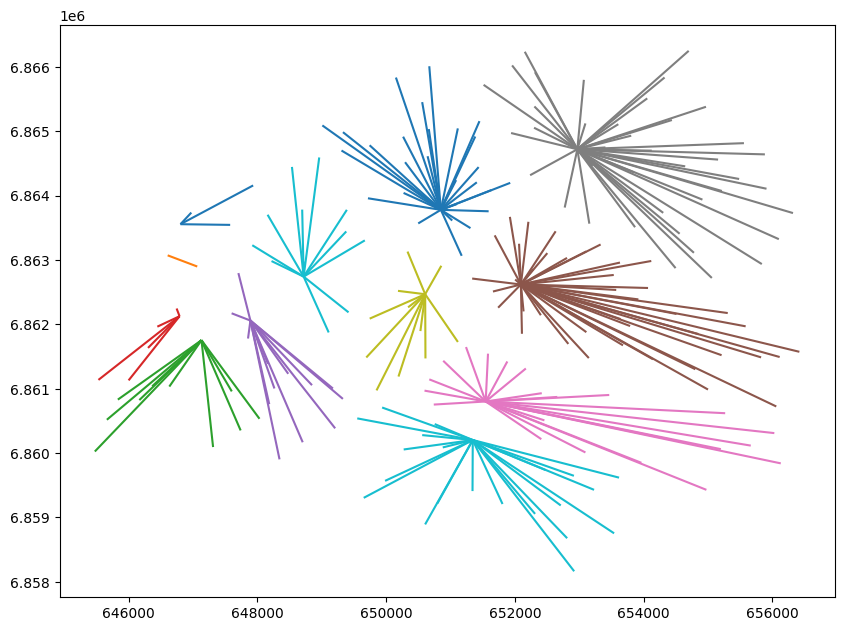

In [23]:
#Générer une nouvelle couche de lignes

LinkMetroRer = Metros.copy()
LinkMetroRer = LinkMetroRer.set_geometry('line', crs=2154)
LinkMetroRer.plot(figsize =(10,10), column = 'nearest_stations')
LinkMetroRer.head(3)

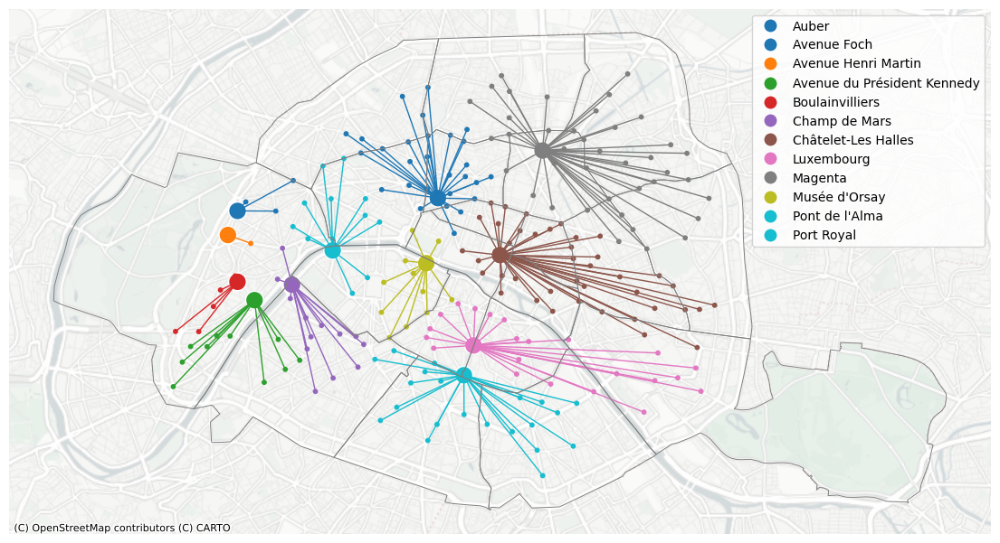

In [24]:
#Faire une carte

Carteflux1, ax = plt.subplots(figsize=(14,14))

RER.to_crs('EPSG:3857').plot(ax=ax, markersize = 200, column = 'nom_long', edgecolor = "white", legend = True)
Metros.to_crs('EPSG:3857').plot(ax=ax, markersize = 10, column = 'nearest_stations')
LinkMetroRer.to_crs('EPSG:3857').plot(ax=ax, column = 'nearest_stations', linewidth=1)

ARDT.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.7, color = 'grey')
ctx.add_basemap(ax,  source=ctx.providers.CartoDB.PositronNoLabels)

ax.axis("off")
plt.show()

# 🏡 Applicatif d'indicateurs urbanistiques à l'échelle d'une commune

## Importation des données

### Importation des données via cadastre.data.gouv.fr

URL du site Web : https://cadastre.data.gouv.fr/datasets/cadastre-etalab

* Nous travaillons ici sur la commune de Cesson Sévigné (code insee 35051)
* Reproduire sur la commune de Bruz (35047)

In [ ]:
#Téléchargement des datas depuis cadastre.data.gouv
!wget https://cadastre.data.gouv.fr/bundler/cadastre-etalab/communes/35051/shp/batiments -O batiments.zip
!wget https://cadastre.data.gouv.fr/bundler/cadastre-etalab/communes/35051/shp/parcelles -O parcelles.zip
!wget https://cadastre.data.gouv.fr/bundler/cadastre-etalab/communes/35051/shp/sections -O sections.zip

,id,commune,prefixe,code,created,updated,geometry
0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,"POLYGON ((357095.719 6790338.898, 357089.99 67..."
1,35051000AB,35051,000,AB,2020-06-16,2020-06-22,"POLYGON ((357603.646 6790021.629, 357544.963 6..."
2,35051000AC,35051,000,AC,2020-06-16,2020-06-22,"POLYGON ((357841.087 6789716.194, 357850.289 6..."


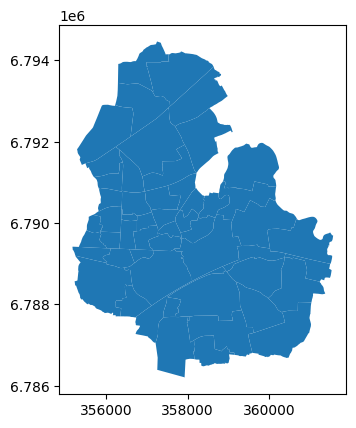

In [27]:
#Chargement couche des Sections cadastrales

Sections= gpd.read_file("sections.zip", encoding='utf-8')
Sections.plot()
Sections.head(3)

,id,commune,prefixe,section,numero,contenance,created,updated,geometry
0,35051000AA0562,35051,000,AA,562,42655.0,2020-06-16,2024-05-23,"POLYGON ((357147.131 6790343.595, 357174.713 6..."
1,35051000AA0564,35051,000,AA,564,21375.0,2020-06-16,2024-05-23,"POLYGON ((357023.822 6790674.048, 357025.859 6..."
2,35051000AA0563,35051,000,AA,563,6378.0,2020-06-16,2024-05-23,"POLYGON ((357515.617 6790355.263, 357541.619 6..."


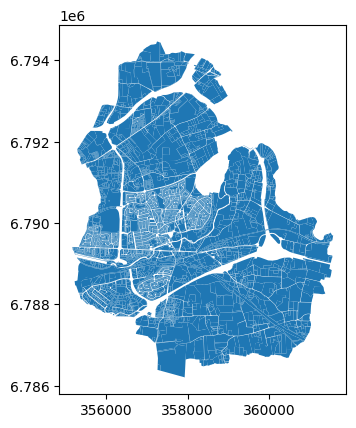

In [28]:
#Chargement couche des Parcelles

Parcelles= gpd.read_file("parcelles.zip", encoding='utf-8')
Parcelles.plot()
Parcelles.head(3)

,commune,nom,type,created,updated,geometry
0,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357222.008 6790493.977, 357213.758 6..."
1,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357187.13 6790473.351, 357193.638 67..."
2,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357208.471 6790399.177, 357213.178 6..."


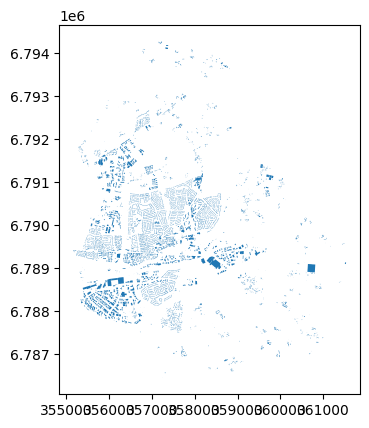

In [29]:
#Chargement couche des Batiments

Batiments= gpd.read_file("batiments.zip", encoding='utf-8')
Batiments.plot()
Batiments.head(3)

### Importation des données via l'API du GPU

https://apicarto.ign.fr/api/doc/gpu

--2025-04-02 11:30:17--  https://apicarto.ign.fr/api/gpu/zone-urba?partition=DU_243500139
Resolving apicarto.ign.fr (apicarto.ign.fr)... 57.128.40.173
Connecting to apicarto.ign.fr (apicarto.ign.fr)|57.128.40.173|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 16716996 (16M) [application/json]
Saving to: ‘PLU.geojson’

PLU.geojson         100%[===================>]  15.94M  4.95MB/s    in 3.2s    

2025-04-02 11:30:26 (4.95 MB/s) - ‘PLU.geojson’ saved [16716996/16716996]



,id,gid,gpu_doc_id,gpu_status,gpu_timestamp,partition,libelle,libelong,typezone,destdomi,...,datvalid,idurba,idzone,lib_idzone,formdomi,destoui,destcdt,destnon,symbole,geometry
0,zone_urba.fid--7c11b838_195f60679c4_-3106,2342916,976d5f45c93f62fd66fe921b6a2af78e,production,2025-03-13 08:03:27.746000+00:00,DU_243500139,UE2a,,U,None,...,20250227,243500139_PLUI_20250227,None,,None,None,None,None,None,"MULTIPOLYGON (((341462.106 6794834.004, 341480..."
1,zone_urba.fid--7c11b838_195f60679c4_-3105,2342932,976d5f45c93f62fd66fe921b6a2af78e,production,2025-03-13 08:03:27.746000+00:00,DU_243500139,UI3,,U,None,...,20250227,243500139_PLUI_20250227,None,,None,None,None,None,None,"MULTIPOLYGON (((351620.977 6792811.215, 351623..."
2,zone_urba.fid--7c11b838_195f60679c4_-3104,2344712,976d5f45c93f62fd66fe921b6a2af78e,production,2025-03-13 08:03:27.746000+00:00,DU_243500139,A,,A,None,...,20250227,243500139_PLUI_20250227,None,,None,None,None,None,None,"MULTIPOLYGON (((358607.087 6777616.016, 358699..."


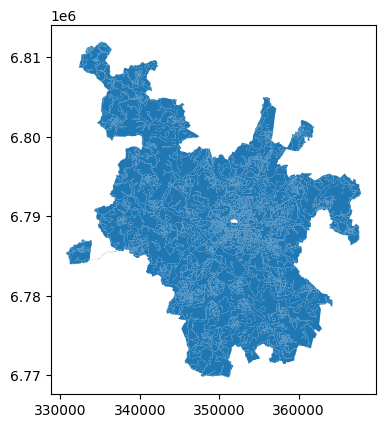

In [30]:
#Importer le PLU de Rennes Métropole via l'API du GPU
!wget -O PLU.geojson https://apicarto.ign.fr/api/gpu/zone-urba?partition=DU_243500139

#Chargement couche du PLU
PLU= gpd.read_file("PLU.geojson", encoding='utf-8')
PLU = PLU.to_crs("EPSG:2154")
PLU.plot()
PLU.head(3)

## Préparation des couches

In [ ]:
# Vérifier le SCR des couches

Batiments.crs
Parcelles.crs
Sections.crs
PLU.crs

In [ ]:
#Créer un ID unique pour chaque batiment (id unique)

Batiments["ID_Bati"] = Batiments.index
Batiments.head()

,commune,nom,type,created,updated,geometry,ID_Bati
0,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357222.008 6790493.977, 357213.758 6...",0
1,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357187.13 6790473.351, 357193.638 67...",1
2,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357208.471 6790399.177, 357213.178 6...",2
3,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357201.063 6790536.791, 357202.418 6...",3
4,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357170.131 6790496.341, 357177.821 6...",4


In [ ]:
# Créer un ID unique pour chaque parcelle (concaténation de deux champs)

Parcelles["ID_Parcelle"] = Parcelles["prefixe"] + "-" + Parcelles["section"] + "-" + Parcelles["numero"]
Parcelles.head(3)

,id,commune,prefixe,section,numero,contenance,created,updated,geometry,ID_Parcelle
0,35051000AA0562,35051,000,AA,562,42655.0,2020-06-16,2024-05-23,"POLYGON ((357147.131 6790343.595, 357174.713 6...",000-AA-562
1,35051000AA0564,35051,000,AA,564,21375.0,2020-06-16,2024-05-23,"POLYGON ((357023.822 6790674.048, 357025.859 6...",000-AA-564
2,35051000AA0563,35051,000,AA,563,6378.0,2020-06-16,2024-05-23,"POLYGON ((357515.617 6790355.263, 357541.619 6...",000-AA-563


In [ ]:
# Créer un ID unique pour chaque section (concaténation de deux champs)

Sections["ID_Section"] = Sections["prefixe"] + "-" + Sections["code"]
Sections.head(3)

,id,commune,prefixe,code,created,updated,geometry,ID_Section
0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,"POLYGON ((357095.719 6790338.898, 357089.99 67...",000-AA
1,35051000AB,35051,000,AB,2020-06-16,2020-06-22,"POLYGON ((357603.646 6790021.629, 357544.963 6...",000-AB
2,35051000AC,35051,000,AC,2020-06-16,2020-06-22,"POLYGON ((357841.087 6789716.194, 357850.289 6...",000-AC


In [ ]:
# Ajouter une colonne surface aux sections cadastrales (entier)

Sections["Surface_Section"] = Sections['geometry'].area
Sections["Surface_Section"] = Sections["Surface_Section"].astype(int)
Sections.head(3)

,id,commune,prefixe,code,created,updated,geometry,ID_Section,Surface_Section
0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,"POLYGON ((357095.719 6790338.898, 357089.99 67...",000-AA,369064
1,35051000AB,35051,000,AB,2020-06-16,2020-06-22,"POLYGON ((357603.646 6790021.629, 357544.963 6...",000-AB,214286
2,35051000AC,35051,000,AC,2020-06-16,2020-06-22,"POLYGON ((357841.087 6789716.194, 357850.289 6...",000-AC,142503


In [ ]:
# Ajouter une colonne surface aux parcelles cadastrales (entier)

Parcelles["Surface_Parcelle"] = Parcelles['geometry'].area
Parcelles["Surface_Parcelle"] = Parcelles["Surface_Parcelle"].astype(int)
Parcelles.head(3)

,id,commune,prefixe,section,numero,contenance,created,updated,geometry,ID_Parcelle,Surface_Parcelle
0,35051000AA0562,35051,000,AA,562,42655.0,2020-06-16,2024-05-23,"POLYGON ((357147.131 6790343.595, 357174.713 6...",000-AA-562,42589
1,35051000AA0564,35051,000,AA,564,21375.0,2020-06-16,2024-05-23,"POLYGON ((357023.822 6790674.048, 357025.859 6...",000-AA-564,23922
2,35051000AA0563,35051,000,AA,563,6378.0,2020-06-16,2024-05-23,"POLYGON ((357515.617 6790355.263, 357541.619 6...",000-AA-563,5647


In [ ]:
# Ajouter une colonne surface aux batiments

Batiments["Surface_Batiment"] = Batiments['geometry'].area
Batiments["Surface_Batiment"] = Batiments["Surface_Batiment"].astype(int)
Batiments.head(3)

,commune,nom,type,created,updated,geometry,ID_Bati,Surface_Batiment
0,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357222.008 6790493.977, 357213.758 6...",0,100
1,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357187.13 6790473.351, 357193.638 67...",1,92
2,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357208.471 6790399.177, 357213.178 6...",2,114


<Axes: >

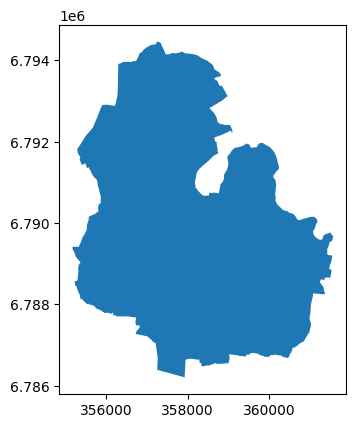

In [ ]:
# Créer une couche avec l'emprise de la commune d'étude

Contours = Sections.dissolve(by="commune")
Contours.plot()

<Axes: >

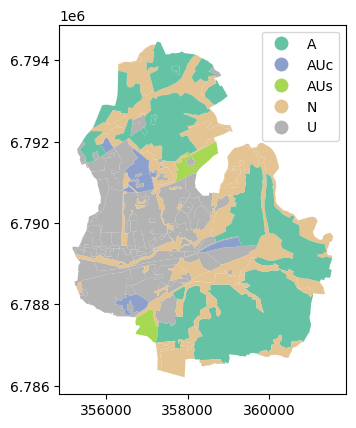

In [ ]:
#Ne garder sur le PLU de la commune
PLUCommune = gpd.overlay(PLU, Contours, how='intersection')
PLUCommune.plot(column='typezone', legend=True, cmap='Set2')

## Analyse spatiale

*   Compter le nombre de bâtiments par section cadastrale
*   Compter le nombre de bâtiments par parcelle cadastrale
*   Calculer la proportion de surface des bâtiments par parcelle cadastrale
*   Compter le nombre de parcelles par type de zonage
*   Compter le nombre de bâtiments par type de zonage

### Compter le nombre de bâtiments par section cadastrale


<Axes: >

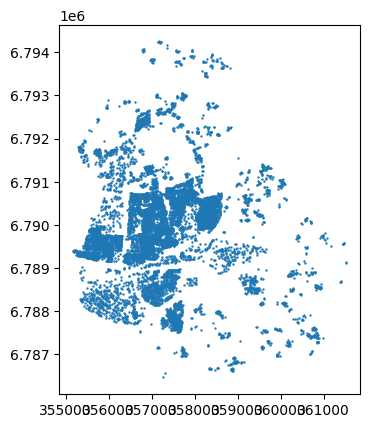

In [ ]:
#Transformer les batiments (polygones) en points (centroides)

BatimentsCentro = Batiments.copy()
BatimentsCentro.geometry = BatimentsCentro['geometry'].centroid
BatimentsCentro.plot( markersize=0.5, legend=True)

In [ ]:
# Encrichir les batiments des informations de la couche des Sections Cadastrales (jointure spatiale)

BatimentsEtape1 = gpd.sjoin(BatimentsCentro, Sections)
BatimentsEtape1.head(5)

,commune_left,nom,type,created_left,updated_left,geometry,ID_Bati,Surface_Batiment,index_right,id,commune_right,prefixe,code,created_right,updated_right,ID_Section,Surface_Section
0,35051,None,01,2020-06-16,2020-06-22,POINT (357214.927 6790493.368),0,100,0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,000-AA,369064
1,35051,None,01,2020-06-16,2020-06-22,POINT (357186.831 6790466.391),1,92,0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,000-AA,369064
2,35051,None,01,2020-06-16,2020-06-22,POINT (357216.9 6790398.322),2,114,0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,000-AA,369064
3,35051,None,01,2020-06-16,2020-06-22,POINT (357196.77 6790531.821),3,139,0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,000-AA,369064
4,35051,None,01,2020-06-16,2020-06-22,POINT (357176.881 6790496.643),4,107,0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,000-AA,369064


In [ ]:
#Réorganiser la table

BatimentsEtape2 = BatimentsEtape1[["ID_Bati", "type", "code", "Surface_Batiment", "ID_Section", "Surface_Section", "geometry"]]
BatimentsEtape2.head(3)

,ID_Bati,type,code,Surface_Batiment,ID_Section,Surface_Section,geometry
0,0,01,AA,100,000-AA,369064,POINT (357214.927 6790493.368)
1,1,01,AA,92,000-AA,369064,POINT (357186.831 6790466.391)
2,2,01,AA,114,000-AA,369064,POINT (357216.9 6790398.322)


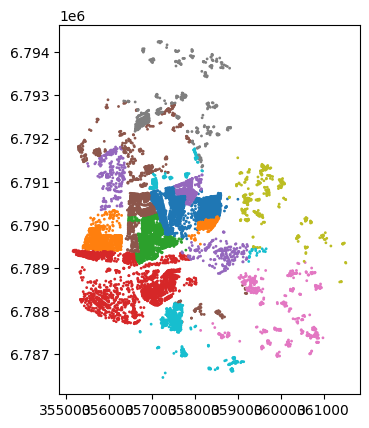

In [ ]:
# Faire une carte des batiments catégorisée par code de section

map2 = BatimentsEtape2.plot(column='ID_Section', markersize=1, legend=False).get_figure()

In [ ]:
# Calculer le  nombre de batiments par sections cadastrale

NbBatiSection = BatimentsEtape2[["ID_Section", "ID_Bati"]].groupby("ID_Section").size()
NbBatiSection = pd.DataFrame(NbBatiSection)
NbBatiSection = NbBatiSection.rename(columns={0: 'NbBatis'})
NbBatiSection.head(3)

,NbBatis
ID_Section,
000-AA,475
000-AB,264
000-AC,117


In [ ]:
# Compter le nombre de batiment (vérification)

total1 = Batiments['geometry'].count()
total2 = NbBatiSection['NbBatis'].sum()
print(total1)
print(total1)

9345
9345


In [ ]:
# Jointure attributaire pour repasser sur la couche des sections cadastrales

Sections = Sections.merge(NbBatiSection, on='ID_Section')
Sections.head(3)

,id,commune,prefixe,code,created,updated,geometry,ID_Section,Surface_Section,NbBatis
0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,"POLYGON ((357095.719 6790338.898, 357089.99 67...",000-AA,369064,475
1,35051000AB,35051,000,AB,2020-06-16,2020-06-22,"POLYGON ((357603.646 6790021.629, 357544.963 6...",000-AB,214286,264
2,35051000AC,35051,000,AC,2020-06-16,2020-06-22,"POLYGON ((357841.087 6789716.194, 357850.289 6...",000-AC,142503,117


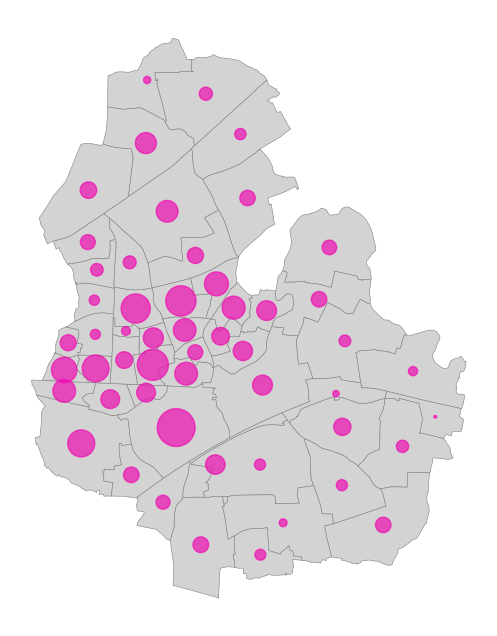

In [ ]:
# Faire une carte pour représenter le nombre de batiments pas section cadastrale

SectionsCentro = Sections.copy()
SectionsCentro.geometry = SectionsCentro['geometry'].centroid

Carte1, ax = plt.subplots(figsize=(8,8))  # Configuration de la carte

Sections.plot(ax=ax, color="lightgray", edgecolor="grey", linewidth=0.4)
SectionsCentro.plot(ax=ax,color="#ee0db1", markersize="NbBatis",alpha=0.7, categorical=False, legend=True)

ax.axis("off")
plt.show()

<Axes: ylabel='Frequency'>

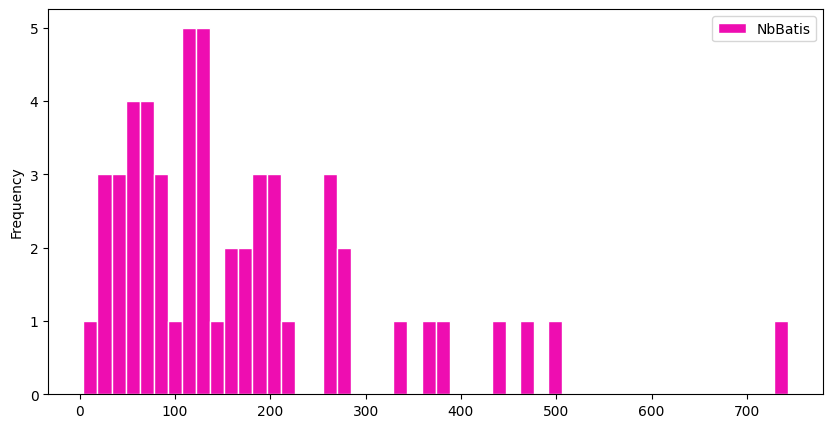

In [ ]:
# Histogramme

NbBatiSection.plot.hist(figsize = (10,5), bins=50, color="#ee0db1", edgecolor='white')

### Calcul du taux de recouvrement du bati à la parcelle

> Méthode à discuter !



In [ ]:
# Ajouter des index spatiaux aux couches
Batiments.sindex
Parcelles.sindex

In [ ]:
#Grouper les batiments dans une seule entité spatiale
Batimentsgroup = Batiments.unary_union
Batimentsgroup = gpd.GeoDataFrame(geometry=[Batimentsgroup], crs=Batiments.crs)
Batimentsgroup.head()
Batimentsgroup.sindex

<ipython-input-47-452f6116ddac>:2: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  Batimentsgroup = Batiments.unary_union


In [ ]:
# Couper les batiments par rapport aux parcelles (environ 1 mn)
Batimentsok = gpd.overlay(Batimentsgroup, Parcelles, how='intersection')

<ipython-input-48-c6a98bfc9219>:2: UserWarning: `keep_geom_type=True` in overlay resulted in 2840 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  Batimentsok = gpd.overlay(Batimentsgroup, Parcelles, how='intersection')


In [ ]:
len(Batiments)

9345

In [ ]:
len(Batimentsok)

6043

In [ ]:
#Créer un ID unique pour chaque batiment (id unique)
Batimentsok["ID_Bati"] = Batimentsok.index
Batimentsok.head()

,id,commune,prefixe,section,numero,contenance,created,updated,ID_Parcelle,Surface_Parcelle,geometry,ID_Bati
0,35051000AA0562,35051,000,AA,562,42655.0,2020-06-16,2024-05-23,000-AA-562,42589,"POLYGON ((357330.002 6790613.982, 357331.881 6...",0
1,35051000AA0192,35051,000,AA,192,6752.0,2020-06-16,2024-05-23,000-AA-192,6609,"POLYGON ((357413.431 6790762.508, 357414.107 6...",1
2,35051000AA0059,35051,000,AA,59,619.0,2020-06-16,2024-05-23,000-AA-59,621,"POLYGON ((357022.842 6790499.264, 357020.648 6...",2
3,35051000AA0553,35051,000,AA,553,1290.0,2020-06-16,2024-05-23,000-AA-553,1287,"MULTIPOLYGON (((356993.692 6790556.852, 356992...",3
4,35051000AA0137,35051,000,AA,137,610.0,2020-06-16,2024-05-23,000-AA-137,609,"POLYGON ((357254.223 6790544.527, 357251.549 6...",4


In [ ]:
# MAJ de la colonne surface des batiments
Batimentsok["Surface_Batiment"] = Batimentsok['geometry'].area
Batimentsok["Surface_Batiment"] = Batimentsok["Surface_Batiment"].astype(int)
Batimentsok.head(3)

,id,commune,prefixe,section,numero,contenance,created,updated,ID_Parcelle,Surface_Parcelle,geometry,ID_Bati,Surface_Batiment
0,35051000AA0562,35051,000,AA,562,42655.0,2020-06-16,2024-05-23,000-AA-562,42589,"POLYGON ((357330.002 6790613.982, 357331.881 6...",0,8
1,35051000AA0192,35051,000,AA,192,6752.0,2020-06-16,2024-05-23,000-AA-192,6609,"POLYGON ((357413.431 6790762.508, 357414.107 6...",1,7
2,35051000AA0059,35051,000,AA,59,619.0,2020-06-16,2024-05-23,000-AA-59,621,"POLYGON ((357022.842 6790499.264, 357020.648 6...",2,125


In [ ]:
# Calculer la proportion des surfaces baties par parcelle cadastrale

recap = Batimentsok.groupby('ID_Parcelle').agg({'Surface_Batiment':'sum','Surface_Parcelle':'max'})
recap["propbatiparcelle"] = recap["Surface_Batiment"] / recap["Surface_Parcelle"] *100
recap.head()

,Surface_Batiment,Surface_Parcelle,propbatiparcelle
ID_Parcelle,,,
000-AA-10,99,796,12.437186
000-AA-100,84,421,19.952494
000-AA-101,139,644,21.583851
000-AA-102,111,528,21.022727
000-AA-103,91,606,15.016502


In [ ]:
# Faire la jointure attributaire avec la couche des parcelles cadastrales et la carte

Parcellesok = Parcelles.merge(recap, on='ID_Parcelle')
Parcellesok.head(2)

,id,commune,prefixe,section,numero,contenance,created,updated,geometry,ID_Parcelle,Surface_Parcelle_x,Surface_Batiment,Surface_Parcelle_y,propbatiparcelle
0,35051000AA0562,35051,000,AA,562,42655.0,2020-06-16,2024-05-23,"POLYGON ((357147.131 6790343.595, 357174.713 6...",000-AA-562,42589,8,42589,0.018784
1,35051000AA0192,35051,000,AA,192,6752.0,2020-06-16,2024-05-23,"POLYGON ((357526.866 6790865.979, 357527.84 67...",000-AA-192,6609,7,6609,0.105916


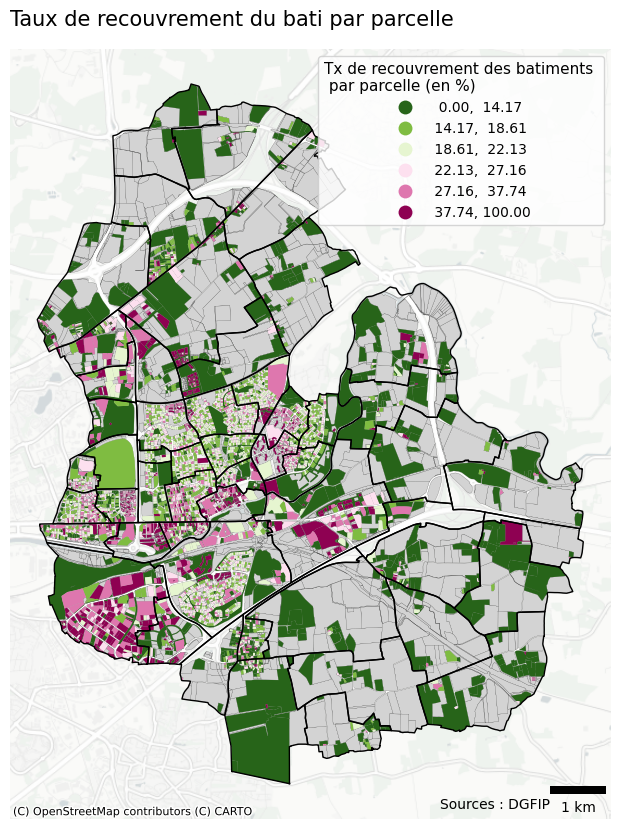

In [ ]:
Carte1, ax = plt.subplots(figsize=(10,10))

Sections.to_crs('EPSG:3857').boundary.plot(ax=ax, edgecolor="black", linewidth=1)
Parcelles.to_crs('EPSG:3857').plot(ax=ax, color="lightgray", edgecolor="black", linewidth=0.1)
Parcellesok.to_crs('EPSG:3857').plot(ax=ax, k=6, column='propbatiparcelle', cmap='PiYG_r', scheme='quantiles', legend=True,
                                     legend_kwds={'title': "Tx de recouvrement des batiments \n par parcelle (en %)", 'loc': 'upper right', 'title_fontsize': 11, 'fontsize': 10})

ctx.add_basemap(ax, source=ctx.providers.CartoDB.PositronNoLabels)

ax.axis("off")
plt.title('Taux de recouvrement du bati par parcelle', loc='left', fontsize=15)
ax.text(0.90, 0.01, 'Sources : DGFIP', verticalalignment='bottom', horizontalalignment='right', transform=ax.transAxes, color='black', fontsize=10)
ax.add_artist(ScaleBar(1, length_fraction=0.1, location="lower right", box_alpha=0, color="black"))

plt.show()

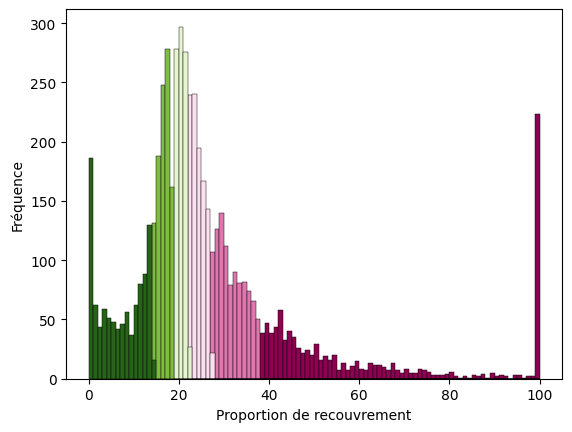

In [ ]:
# Histogramme en fonction de la discrétisation de la carte

import seaborn as sns

# Nombre de quantiles
num_quantiles = 6

# Calculer les quantiles
quantiles = pd.qcut(Parcellesok['propbatiparcelle'], num_quantiles, labels=False)

# Tracer l'histogramme avec des couleurs de quantiles en utilisant Seaborn
sns.histplot(data=Parcellesok, x='propbatiparcelle', bins=100, hue=quantiles, palette='PiYG_r',  alpha=1, legend=False)

# Définir les étiquettes des axes
plt.xlabel("Proportion de recouvrement")
plt.ylabel("Fréquence")

# Afficher le graphe
plt.show()

### Compter le nombre de parcelles par type de zonage

,id,commune,prefixe_left,section,numero,contenance,created_left,updated_left,geometry,ID_Parcelle,...,destcdt,destnon,symbole,id_2,prefixe_right,code,created_right,updated_right,ID_Section,Surface_Section
0,35051000AA0562,35051,000,AA,562,42655.0,2020-06-16,2024-05-23,"POLYGON ((357147.131 6790343.595, 357174.713 6...",000-AA-562,...,None,None,None,35051000AA,000,AA,2020-06-16,2020-06-22,000-AA,369064
0,35051000AA0562,35051,000,AA,562,42655.0,2020-06-16,2024-05-23,"POLYGON ((357147.131 6790343.595, 357174.713 6...",000-AA-562,...,None,None,None,35051000AA,000,AA,2020-06-16,2020-06-22,000-AA,369064


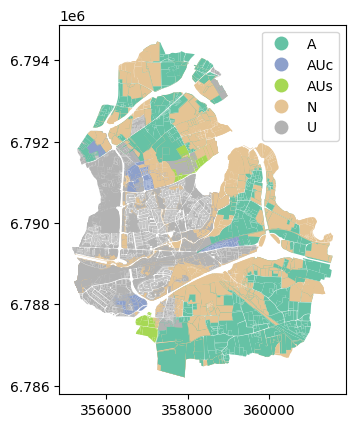

In [ ]:
# Encrichir les batiments des informations de la couche PLU (jointure spatiale)

ParcellesPLU = gpd.sjoin(Parcelles, PLUCommune)
ParcellesPLU.plot(column='typezone', legend=True, cmap='Set2')
ParcellesPLU.head(2)

,id
typezone,
A,1306
AUc,436
AUs,89
N,1737
U,8257


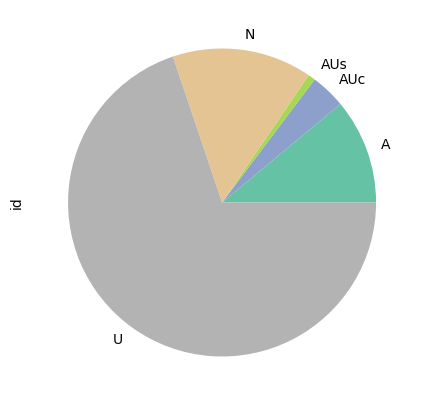

In [ ]:
# Graphique du nombre de parcelles par zonage

Categorie = ParcellesPLU[["typezone", "id"]].groupby("typezone").count()
Categorie.plot.pie(figsize =(14,5), y="id", cmap='Set2', legend=False)
Categorie.head()

### Compter le nombre de bâtiments par type de zonage

## Cartographie du risque d'innondation 🌊

### Préparation des couches

In [ ]:
#Téléchargement des datas depuis le portail opendata de Rennes
!wget -O hydrographie.geojson https://data.rennesmetropole.fr/explore/dataset/reseau_hydrographique/download/?format=geojson&timezone=Europe/Berlin&lang=fr

--2025-03-31 19:12:26--  https://data.rennesmetropole.fr/explore/dataset/reseau_hydrographique/download/?format=geojson
Resolving data.rennesmetropole.fr (data.rennesmetropole.fr)... 52.211.64.165, 18.200.140.238
Connecting to data.rennesmetropole.fr (data.rennesmetropole.fr)|52.211.64.165|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/json]
Saving to: ‘hydrographie.geojson’

hydrographie.geojso     [         <=>        ]  16.53M  5.23MB/s    in 3.2s    

2025-03-31 19:12:31 (5.23 MB/s) - ‘hydrographie.geojson’ saved [17337747]



,gml_id,hydro_code_insee,deno_hydro_id,objectid,type_hydro_id,type_hydro_nom,deno_hydr_nom,ope_id,hydro_date_maj,hydro_visible,geometry
0,v_hydro.2684,35173.0,1.0,2684,2,étang,None,1.0,NaT,1,"POLYGON ((334336.582 6809114.535, 334332.898 6..."
1,v_hydro.2841,35177.0,1.0,2841,2,étang,None,1.0,NaT,1,"POLYGON ((356631.296 6799637.896, 356637.225 6..."
2,v_hydro.2700,35146.0,132.0,2700,5,ruisseau,le Mainbuet,1.0,NaT,1,"POLYGON ((348784.491 6802313.385, 348783.363 6..."


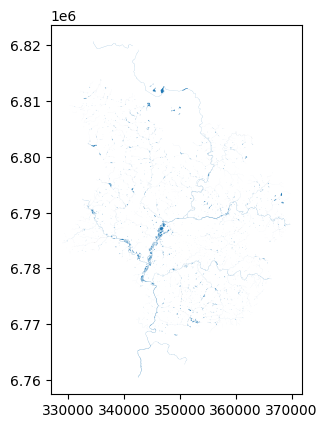

In [ ]:
#Chargement couche hydrographie

Hydrographie= gpd.read_file("hydrographie.geojson", encoding='utf-8')
Hydrographie = Hydrographie.to_crs("EPSG:2154")
Hydrographie.plot()
Hydrographie.head(3)

<Axes: >

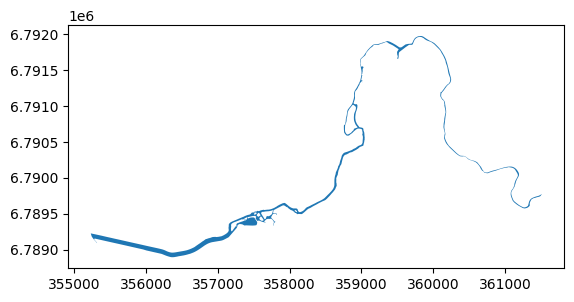

In [ ]:
# Ne garder que les troncons de type "fleuve" dans la commune d'étude

Fleuve = Hydrographie[(Hydrographie["type_hydro_nom"] == 'fleuve')]
Hydrocommunetrace = gpd.overlay(Fleuve, Contours, how='intersection')
Hydrocommunetrace.plot()

<Axes: >

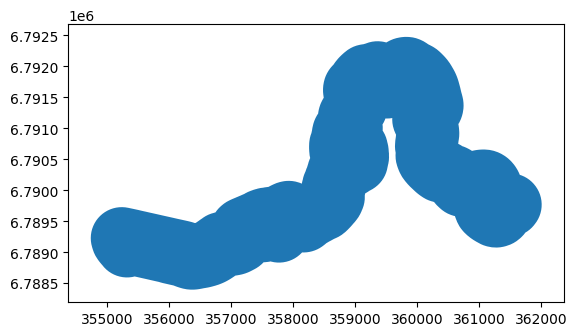

In [ ]:
#Faire un buffer de 500m autour de la couche hydro
Hydrocommune = Hydrocommunetrace.copy()
Hydrocommune['geometry'] = Hydrocommune['geometry'].buffer(500)
Hydrocommune = Hydrocommune.dissolve(by ='deno_hydr_nom')
Hydrocommune.plot()

<Axes: >

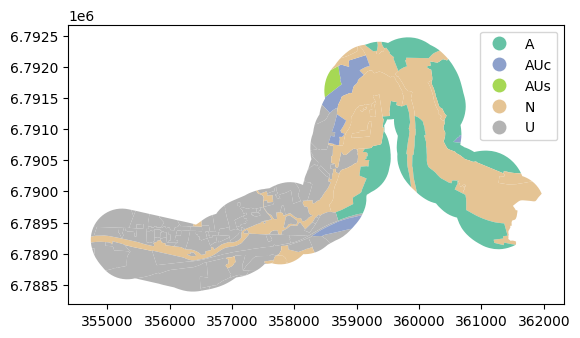

In [ ]:
# Garder le zonage situés à moins de 500m de la Vilaine
Zonagerisque = gpd.overlay(PLU, Hydrocommune, how='intersection')
Zonagerisque.plot(column = 'typezone', legend = True, cmap='Set2')

<Axes: >

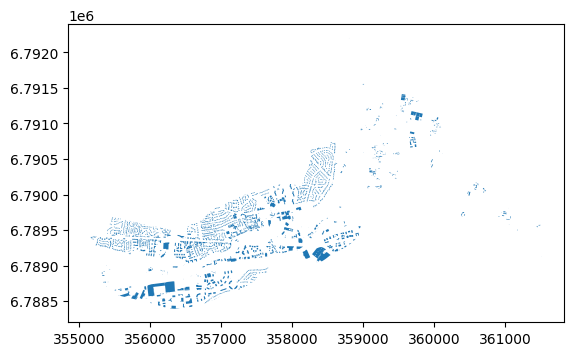

In [ ]:
# Garder les bâtiments situés à moins de 500m de la Vilaine

Batirisque = gpd.overlay(Batiments, Hydrocommune, how='intersection')
Batirisque.plot()

### Carte de synthèse

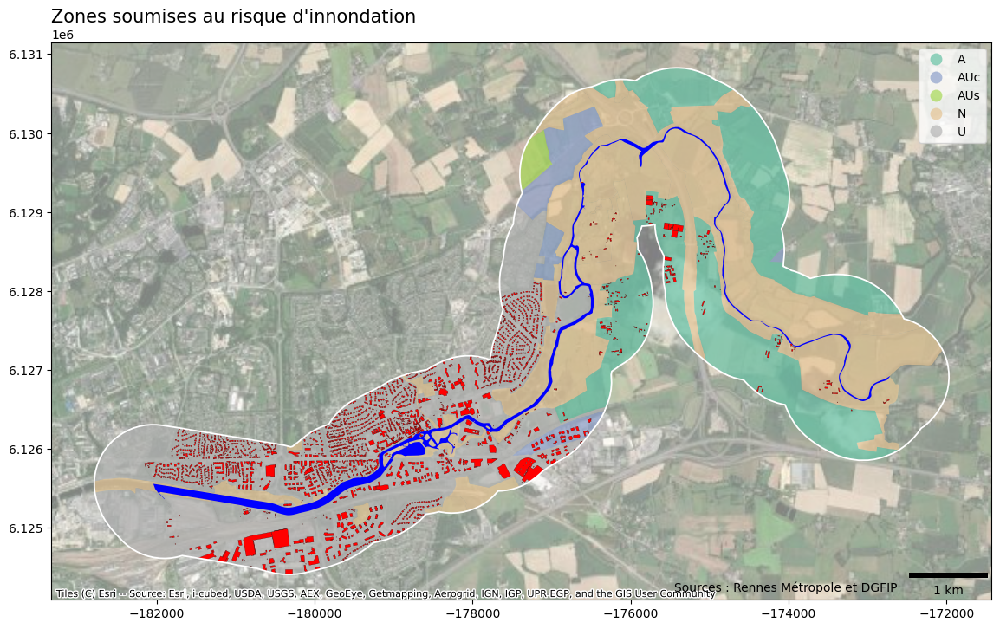

In [ ]:
#Carte récapitulative

Carte1, ax = plt.subplots(figsize=(14,14))
Hydrocommune.boundary.to_crs('EPSG:3857').plot(ax=ax, edgecolor="white", linewidth=1.3)
Zonagerisque.to_crs('EPSG:3857').plot(ax = ax, column = 'typezone', legend = True, alpha=0.7, cmap='Set2')
Batirisque.to_crs('EPSG:3857').plot(ax=ax, color="red", edgecolor="black", linewidth=0.15)
Hydrocommunetrace.to_crs('EPSG:3857').plot(ax=ax, color="blue",linewidth=5)

ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery, alpha=0.5)

plt.title("Zones soumises au risque d'innondation", loc='left', fontsize=15)
ax.text(0.90, 0.01, 'Sources : Rennes Métropole et DGFIP', verticalalignment='bottom', horizontalalignment='right', transform=ax.transAxes, color='black', fontsize=10)
ax.add_artist(ScaleBar(1, length_fraction=0.1, location="lower right", box_alpha=0, color="black"))

plt.show()

# 🚀 Applicatif : indicateur d'urbanisation à l'échelle d'un département

### Préparation des données 💾


In [ ]:
#Téléchargement des datas depuis cadastre.data.gouv

!wget https://cadastre.data.gouv.fr/bundler/cadastre-etalab/departements/05/shp/batiments -O batiments.zip
!wget https://cadastre.data.gouv.fr/bundler/cadastre-etalab/departements/05/shp/communes -O communes.zip
!wget https://cadastre.data.gouv.fr/bundler/cadastre-etalab/departements/05/shp/sections -O sections.zip

In [32]:
#Chargement couche batiment (le temps de chargement peut-être long, environ 3mn)
batiments= gpd.read_file("batiments.zip")
batiments.head(3)

,commune,nom,type,created,updated,geometry
0,05001,None,01,2006-11-01,2019-12-03,"POLYGON ((1006989.398 6420372.597, 1006995.599..."
1,05001,None,01,2006-11-01,2019-12-03,"POLYGON ((1006815 6420560.191, 1006819.047 642..."
2,05001,None,01,2006-11-01,2019-12-03,"POLYGON ((1007869.496 6418963.664, 1007871.1 6..."


In [33]:
len(batiments)

168560

In [34]:
#Chargement couche communes
communes= gpd.read_file("communes.zip", encoding='utf-8')
communes.head(3)

,id,nom,created,updated,geometry
0,05003,AIGUILLES,2006-12-14,2017-03-17,"POLYGON ((1009588.427 6411890.754, 1009510.401..."
1,05018,LA BATIE-VIEILLE,2007-03-09,2019-07-02,"POLYGON ((950898.468 6385985.734, 950894.352 6..."
2,05025,BUISSARD,2008-04-17,2023-12-18,"POLYGON ((950232.638 6399301.15, 950040.131 63..."


In [35]:
len(communes)

162

In [36]:
#Chargement couche sections
sections= gpd.read_file("sections.zip", encoding='utf-8')
sections.head(3)

,id,commune,prefixe,code,created,updated,geometry
0,050030000A,05003,000,A,2006-11-26,2014-02-14,"POLYGON ((1004822.834 6418680.779, 1004820.601..."
1,050040000A,05004,000,A,2017-04-14,2017-05-23,"POLYGON ((952035.688 6396444.305, 952026.181 6..."
2,050060000A,05006,000,A,2016-09-21,2017-05-23,"POLYGON ((968903.758 6414486.78, 968869.928 64..."


In [37]:
len(sections)

1557

In [38]:
# Ajouter des index spatiaux aux couches
batiments.sindex
communes.sindex
sections.sindex

### Exercice à l'échelle des communes 🗾


In [39]:
# Calculer la surface des bâtiments

batiments["Surface_batiments"] = batiments['geometry'].area
batiments['Surface_batiments']=batiments['Surface_batiments'].astype(int)
batiments.head()

,commune,nom,type,created,updated,geometry,Surface_batiments
0,05001,None,01,2006-11-01,2019-12-03,"POLYGON ((1006989.398 6420372.597, 1006995.599...",32
1,05001,None,01,2006-11-01,2019-12-03,"POLYGON ((1006815 6420560.191, 1006819.047 642...",29
2,05001,None,01,2006-11-01,2019-12-03,"POLYGON ((1007869.496 6418963.664, 1007871.1 6...",135
3,05001,None,01,2006-11-01,2019-12-03,"POLYGON ((1007985.824 6418916.451, 1007989.503...",39
4,05001,None,01,2006-11-01,2019-12-03,"POLYGON ((1007865.693 6418968.847, 1007859.628...",59


In [40]:
# Calculer la somme des surfaces des bâtiments par commune

SurfaceBatisCommunes = batiments.groupby('commune').agg({'Surface_batiments':'sum'})
SurfaceBatisCommunes.head()

,Surface_batiments
commune,
05001,71846
05003,50215
05004,167972
05006,200306
05007,81247


In [41]:
# Calculer la surface des communes

communes["Surface_commune"] = communes['geometry'].area
communes["Surface_commune"]= communes["Surface_commune"].astype(int)
communes.head()

,id,nom,created,updated,geometry,Surface_commune
0,05003,AIGUILLES,2006-12-14,2017-03-17,"POLYGON ((1009588.427 6411890.754, 1009510.401...",40961501
1,05018,LA BATIE-VIEILLE,2007-03-09,2019-07-02,"POLYGON ((950898.468 6385985.734, 950894.352 6...",9064768
2,05025,BUISSARD,2008-04-17,2023-12-18,"POLYGON ((950232.638 6399301.15, 950040.131 63...",2937409
3,05037,CHATEAUVIEUX,2006-10-16,2024-11-20,"POLYGON ((942776.97 6378561.281, 942753.898 63...",7188870
4,05046,EMBRUN,2006-12-19,2019-04-03,"POLYGON ((977737.159 6388707.825, 977683.478 6...",36480523


In [42]:
# Jointure attributaire pour enrichir la couche des communes

communes = communes.merge(SurfaceBatisCommunes,left_on='id', right_on='commune')
communes.head()

,id,nom,created,updated,geometry,Surface_commune,Surface_batiments
0,05003,AIGUILLES,2006-12-14,2017-03-17,"POLYGON ((1009588.427 6411890.754, 1009510.401...",40961501,50215
1,05018,LA BATIE-VIEILLE,2007-03-09,2019-07-02,"POLYGON ((950898.468 6385985.734, 950894.352 6...",9064768,46466
2,05025,BUISSARD,2008-04-17,2023-12-18,"POLYGON ((950232.638 6399301.15, 950040.131 63...",2937409,26392
3,05037,CHATEAUVIEUX,2006-10-16,2024-11-20,"POLYGON ((942776.97 6378561.281, 942753.898 63...",7188870,79065
4,05046,EMBRUN,2006-12-19,2019-04-03,"POLYGON ((977737.159 6388707.825, 977683.478 6...",36480523,478659


In [43]:
# Créer l'indicateur de tx de recouvrement des batimenst

communes["indic"] = communes["Surface_batiments"] / communes["Surface_commune"]*100
communes.head(3)

,id,nom,created,updated,geometry,Surface_commune,Surface_batiments,indic
0,05003,AIGUILLES,2006-12-14,2017-03-17,"POLYGON ((1009588.427 6411890.754, 1009510.401...",40961501,50215,0.122591
1,05018,LA BATIE-VIEILLE,2007-03-09,2019-07-02,"POLYGON ((950898.468 6385985.734, 950894.352 6...",9064768,46466,0.512600
2,05025,BUISSARD,2008-04-17,2023-12-18,"POLYGON ((950232.638 6399301.15, 950040.131 63...",2937409,26392,0.898479


Text(0.0, 1.0, 'Taux de recouvrement des bâtiments dans le 05')

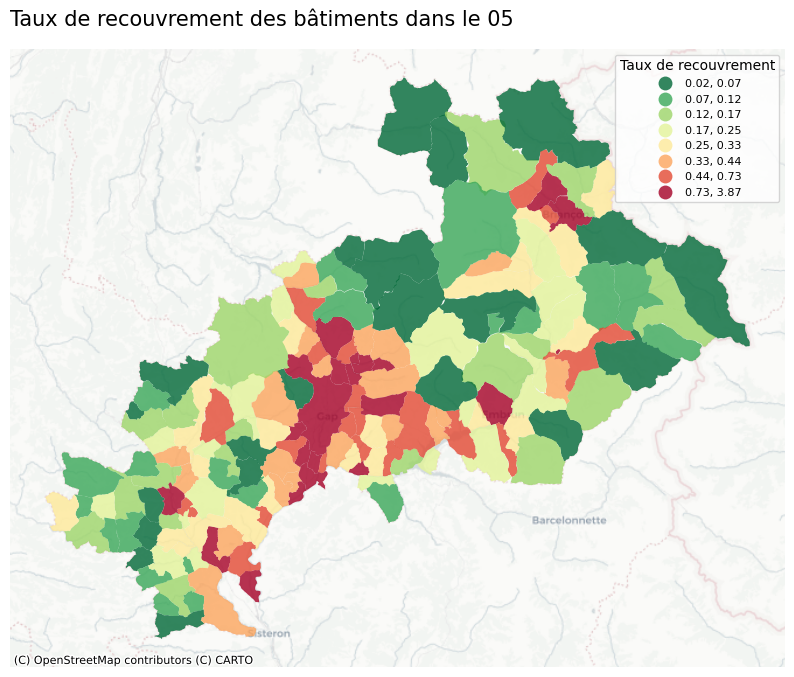

In [44]:
# Faire la carte

Carte1, ax = plt.subplots(figsize=(10,10))

communes.to_crs('EPSG:3857').plot(ax=ax, k=8, column="indic", cmap='RdYlGn_r',scheme='quantiles', alpha=0.8, categorical=False,
                                    legend=True, legend_kwds={'title': "Taux de recouvrement", 'loc': 'upper right', 'title_fontsize':10, 'fontsize':8})
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.title("Taux de recouvrement des bâtiments dans le 05", loc='left', fontsize=15)


### Exercice à l'échelle des sections cadastrales 🏡


In [45]:
# Calculer la surface des sections

sections["Surface_sections"] = sections['geometry'].area
sections["Surface_sections"]= sections["Surface_sections"].astype(int)
sections.head()

,id,commune,prefixe,code,created,updated,geometry,Surface_sections
0,050030000A,05003,000,A,2006-11-26,2014-02-14,"POLYGON ((1004822.834 6418680.779, 1004820.601...",5100321
1,050040000A,05004,000,A,2017-04-14,2017-05-23,"POLYGON ((952035.688 6396444.305, 952026.181 6...",2581147
2,050060000A,05006,000,A,2016-09-21,2017-05-23,"POLYGON ((968903.758 6414486.78, 968869.928 64...",13200604
3,050080000A,05008,000,A,2007-08-11,2017-05-23,"MULTIPOLYGON (((916885.02 6381585.47, 916875.7...",692380
4,050070000A,05007,000,A,2006-11-27,2017-05-23,"POLYGON ((992869.882 6417581.234, 992858.527 6...",7418773


In [46]:
# Faire la jointure spatiale entre les batiments et les sections cadastrales

BatimentsCentro = batiments.copy()
BatimentsCentro.geometry = BatimentsCentro['geometry'].centroid

Batimentssections = gpd.sjoin(BatimentsCentro, sections)
Batimentssections.head(3)

,commune_left,nom,type,created_left,updated_left,geometry,Surface_batiments,index_right,id,commune_right,prefixe,code,created_right,updated_right,Surface_sections
0,05001,None,01,2006-11-01,2019-12-03,POINT (1006992.321 6420369.686),32,6,050010000A,05001,000,A,2006-11-01,2019-12-03,12839552
1,05001,None,01,2006-11-01,2019-12-03,POINT (1006818.821 6420560.484),29,6,050010000A,05001,000,A,2006-11-01,2019-12-03,12839552
2,05001,None,01,2006-11-01,2019-12-03,POINT (1007868.325 6418958.791),135,6,050010000A,05001,000,A,2006-11-01,2019-12-03,12839552


In [47]:
# Calculer la somme des surfaces des bâtiments par sections cadastrales

SurfaceBatisSections= Batimentssections.groupby('id').agg({'Surface_batiments':'sum'})
SurfaceBatisSections.head()

,Surface_batiments
id,
050010000A,615
050010000B,142
050010000C,193
050010000D,4999
050010000E,165


In [48]:
# Jointure attributaire pour enrichir la couche des communes

sections = sections.merge(SurfaceBatisSections,left_on='id', right_on='id')
sections.head()

,id,commune,prefixe,code,created,updated,geometry,Surface_sections,Surface_batiments
0,050030000A,05003,000,A,2006-11-26,2014-02-14,"POLYGON ((1004822.834 6418680.779, 1004820.601...",5100321,401
1,050040000A,05004,000,A,2017-04-14,2017-05-23,"POLYGON ((952035.688 6396444.305, 952026.181 6...",2581147,23066
2,050060000A,05006,000,A,2016-09-21,2017-05-23,"POLYGON ((968903.758 6414486.78, 968869.928 64...",13200604,226
3,050080000A,05008,000,A,2007-08-11,2017-05-23,"MULTIPOLYGON (((916885.02 6381585.47, 916875.7...",692380,18034
4,050070000A,05007,000,A,2006-11-27,2017-05-23,"POLYGON ((992869.882 6417581.234, 992858.527 6...",7418773,2747


In [49]:
# Créer l'indicateur de tx de recouvrement des batimenst

sections["indic"] = sections["Surface_batiments"] / sections["Surface_sections"]*100
sections.head(3)

,id,commune,prefixe,code,created,updated,geometry,Surface_sections,Surface_batiments,indic
0,050030000A,05003,000,A,2006-11-26,2014-02-14,"POLYGON ((1004822.834 6418680.779, 1004820.601...",5100321,401,0.007862
1,050040000A,05004,000,A,2017-04-14,2017-05-23,"POLYGON ((952035.688 6396444.305, 952026.181 6...",2581147,23066,0.893634
2,050060000A,05006,000,A,2016-09-21,2017-05-23,"POLYGON ((968903.758 6414486.78, 968869.928 64...",13200604,226,0.001712


Text(0.0, 1.0, 'Taux de recouvrement des bâtiments dans le 05')

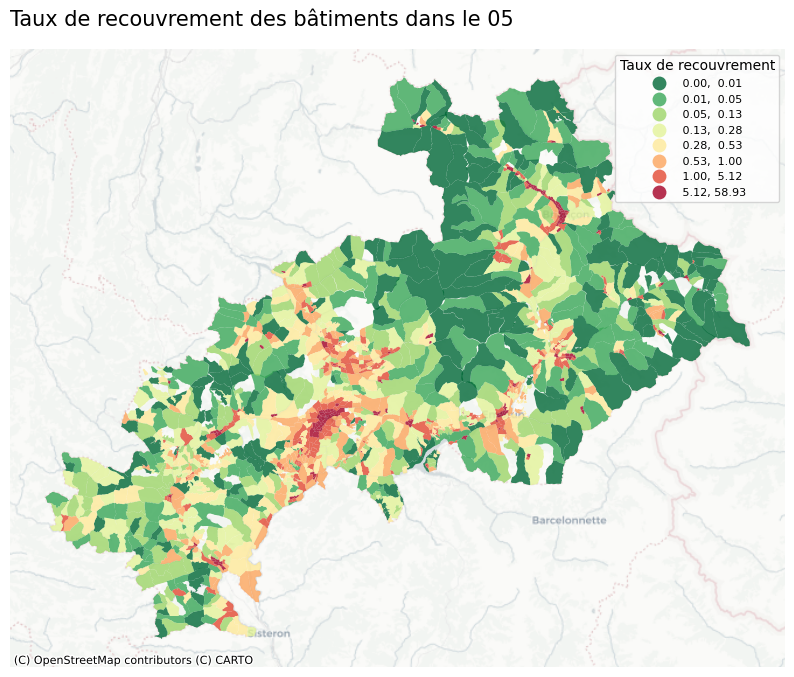

In [50]:
# Faire la carte

Carte1, ax = plt.subplots(figsize=(10,10))

sections.to_crs('EPSG:3857').plot(ax=ax, k=8, column="indic", cmap='RdYlGn_r',scheme='quantiles', alpha=0.8, categorical=False,
                                    legend=True, legend_kwds={'title': "Taux de recouvrement", 'loc': 'upper right', 'title_fontsize':10, 'fontsize':8})
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.title("Taux de recouvrement des bâtiments dans le 05", loc='left', fontsize=15)
